In [2]:
# List the imports here
import matplotlib.pyplot as plt
import math
import random
import numpy as np
from matplotlib.lines import Line2D
import itertools
import os
import cv2
import make_video

In [27]:
class env:
    def __init__(self, x_start, y_start, x_goal, y_goal, rbot, xmin=0, xmax=100, ymin=0, ymax=100):
        self.x_start, self.y_start, self.x_goal, self.y_goal = x_start, y_start, x_goal, y_goal
        self.xlim = (xmin, xmax)
        self.ylim = (ymin, ymax)
        self.rbot = rbot
        self.obstacles()
        
    def obstacles(self):
        # Specify vertices for rectangular obstacles (each object has four vertices).
        v_origx= [40,40,60,60,70,70,80,80,40,40,60,60]
        v_origy= [62,100,100,62,40,60,60,40,0,38,38,0]
        vx = [i for i in v_origx]
        vy = [i for i in v_origy]
        # Centers and radii of the circular obstacles.
        radii = [7, 2, 3]
        circle_x = [20,90,77]
        circle_y = [20,70,82]
        num_circles = len(circle_x)

        self.num_rectangles = 3
        self.obst_x = vx
        self.obst_y = vy
        self.radii = radii
        self.circle_x = circle_x
        self.circle_y = circle_y
        self.num_circles = num_circles
        
    def draw(self):
        #draw boundary
        rbot = self.rbot
        plt.plot([0-2*rbot, 0-2*rbot, 100+2*rbot, 100+2*rbot, 0-2*rbot],
                 [0-2*rbot, 100+2*rbot, 100+2*rbot, 0-2*rbot, 0-2*rbot],'k', lw=0.5)
    
        plt.plot(self.x_goal, self.y_goal , 'g*', markersize = 20)
        plt.plot(self.x_start, self.y_start, 'b*', markersize = 20)
    
        num = len(self.obst_x)/4
        for i in range(1,int(num)+1): # Plotting rectangles
            x = self.obst_x[4*(i-1)]
            y = self.obst_y[4*(i-1)]
            width = self.obst_x[4*(i-1)+2] - self.obst_x[4*(i-1)]
            height = self.obst_y[4*(i-1)+2] - self.obst_y[4*(i-1)]
            rect = plt.Rectangle((x,y), width, height, linewidth=1, color='r')
            plt.gca().add_patch(rect)
    
        for i in range(self.num_circles): #plotting  circles
            circle = plt.Circle((self.circle_x[i], self.circle_y[i]), self.radii[i], color='r')
            plt.gca().add_patch(circle)
    
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()

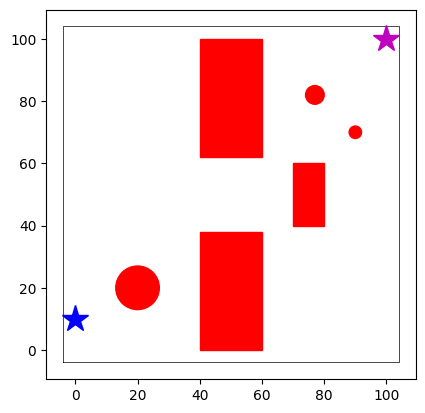

In [28]:
# Goal and start location region
x_sart, y_start, x_goal, y_goal = 0, 10, 100, 100
# Radius of the robot
r_bot = 2
# Environment instance
E = env(x_sart, y_start, x_goal, y_goal, r_bot, 0, 100, 0, 100) 
E.draw()

In [21]:
## Helper function to generate video from individual frames.
def frames_to_video(input_path, output_path, fps):
    '''
        Function to Concatenate given frames and fps into a video file.
        Input Arguments
        input_path  : Path to the input directory containing input frames
        output_path : Path to the output directory containing the video file
        fps         : Frames per Second of the output video
        Return
        Boolean     : True is Video written successfully, False if writing is not successful.
    '''
    image_files = [file for file in os.listdir(input_path) if file.endswith('.png') or file.endswith('jpg')]
    image_files.sort()

    frames = []

    for file in image_files:
        f = os.path.join(input_path, file)
        frame = cv2.imread(f)
        height, width, channels = frame.shape
        size = (width, height)
        frames.append(frame)

    video_writer = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'DIVX'), fps, size)

    for frame in frames:
        video_writer.write(frame)

    video_writer.release()
    return True

# frames_to_video("./results","./results/plot.mp4", 25)

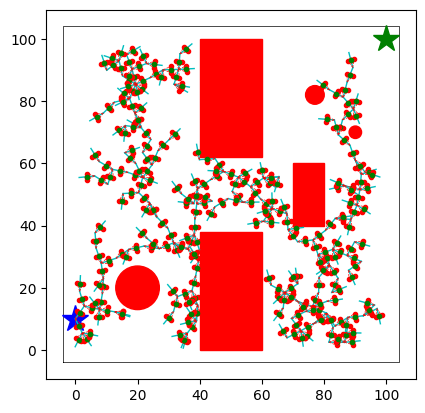

OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


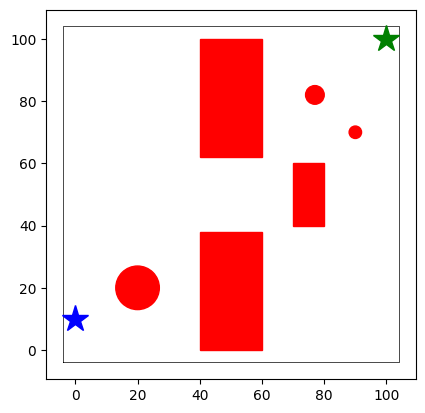

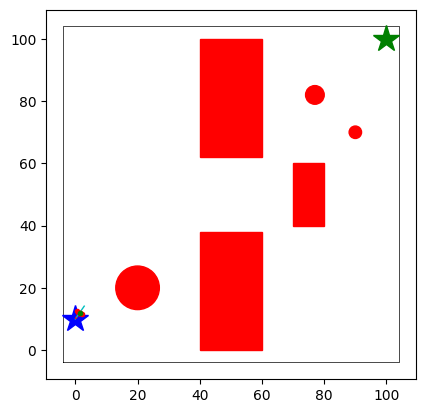

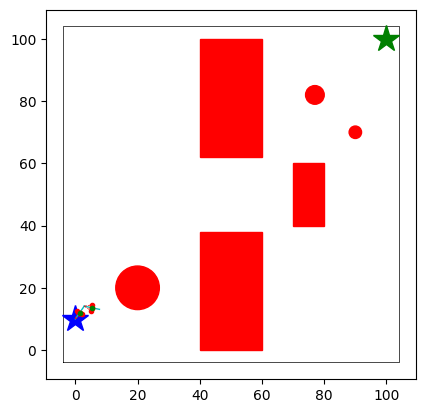

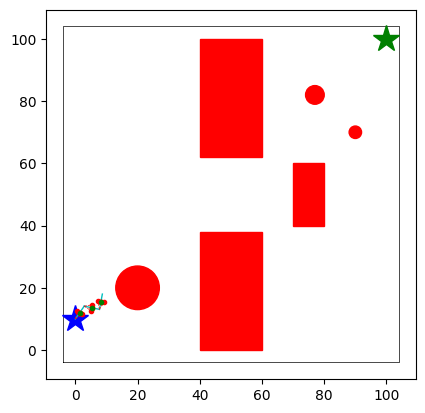

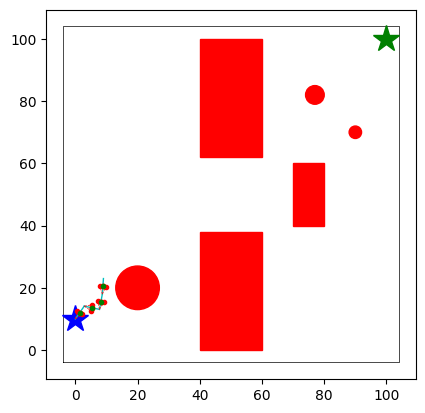

...

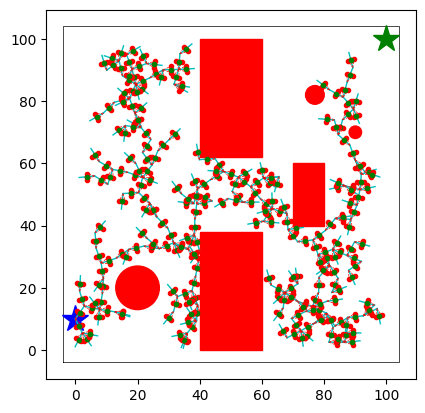

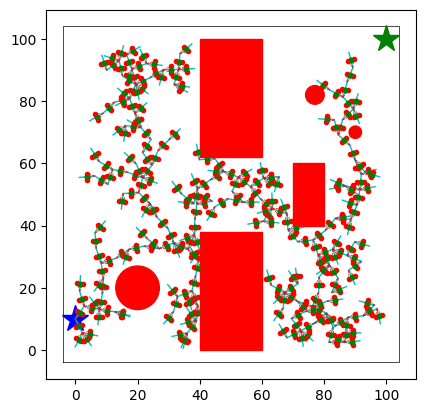

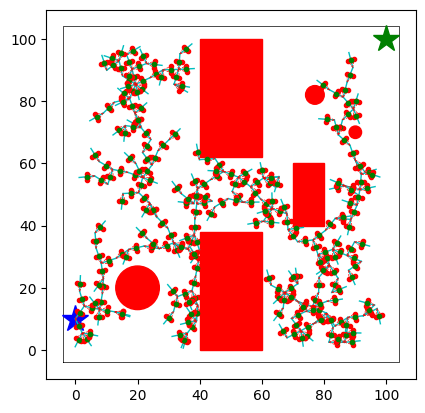

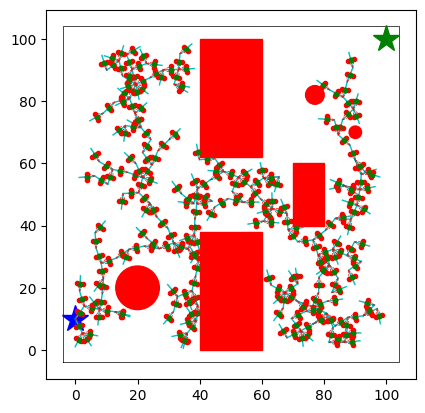

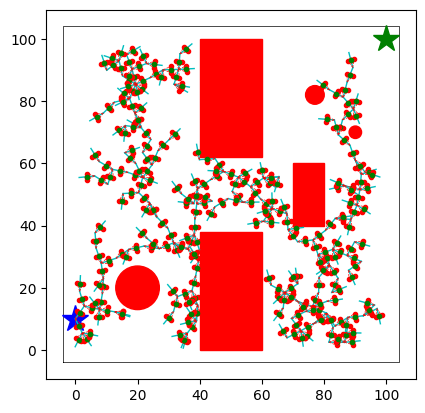

OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


<Figure size 640x480 with 0 Axes>

In [19]:
class env:
    def __init__(self, x_start, y_start, x_goal, y_goal, rbot, xmin=0, xmax=100, ymin=0, ymax=100):
        self.x_start, self.y_start, self.x_goal, self.y_goal = x_start, y_start, x_goal, y_goal
        self.xlim = (xmin, xmax)
        self.ylim = (ymin, ymax)
        self.rbot = rbot
        self.obstacles()

    def obstacles(self):
        # Specify vertices for rectangular obstacles (each object has four vertices).
        v_origx = [40, 40, 60, 60, 70, 70, 80, 80, 40, 40, 60, 60]
        v_origy = [62, 100, 100, 62, 40, 60, 60, 40, 0, 38, 38, 0]
        vx = [i for i in v_origx]
        vy = [i for i in v_origy]
        # Centers and radii of the circular obstacles.
        radii = [7, 2, 3]
        circle_x = [20, 90, 77]
        circle_y = [20, 70, 82]
        num_circles = len(circle_x)

        self.num_rectangles = 3
        self.obst_x = vx
        self.obst_y = vy
        self.radii = radii
        self.circle_x = circle_x
        self.circle_y = circle_y
        self.num_circles = num_circles

    def draw(self, nodes=None, edges=None, node_index=None):
        # Draw boundary
        rbot = self.rbot
        plt.plot([0 - 2 * rbot, 0 - 2 * rbot, 100 + 2 * rbot, 100 + 2 * rbot, 0 - 2 * rbot],
                 [0 - 2 * rbot, 100 + 2 * rbot, 100 + 2 * rbot, 0 - 2 * rbot, 0 - 2 * rbot], 'k', lw=0.5)

        plt.plot(self.x_goal, self.y_goal, 'g*', markersize=20)
        plt.plot(self.x_start, self.y_start, 'b*', markersize=20)

        num = len(self.obst_x) / 4
        for i in range(1, int(num) + 1):  # Plotting rectangles
            x = self.obst_x[4 * (i - 1)]
            y = self.obst_y[4 * (i - 1)]
            width = self.obst_x[4 * (i - 1) + 2] - self.obst_x[4 * (i - 1)]
            height = self.obst_y[4 * (i - 1) + 2] - self.obst_y[4 * (i - 1)]
            rect = plt.Rectangle((x, y), width, height, linewidth=1, color='r')
            plt.gca().add_patch(rect)

        for i in range(self.num_circles):  # plotting  circles
            circle = plt.Circle((self.circle_x[i], self.circle_y[i]), self.radii[i], color='r')
            plt.gca().add_patch(circle)

        if nodes is not None and edges is not None and node_index is not None:
            self.draw_rrt_path(nodes, edges, node_index)

        plt.gca().set_aspect('equal', adjustable='box')
        # plt.show()

    def rrt_algorithm(self, max_iter=1000, step_size=5):
        nodes = [(self.x_start, self.y_start)]
        edges = []
        for _ in range(max_iter):
            random_point = (random.uniform(self.xlim[0], self.xlim[1]),
                            random.uniform(self.ylim[0], self.ylim[1]))

            # Find the nearest node in the tree
            nearest_node = min(nodes, key=lambda node: math.dist(node, random_point))

            # Move towards the random point
            theta = math.atan2(random_point[1] - nearest_node[1], random_point[0] - nearest_node[0])
            new_node = (nearest_node[0] + step_size * math.cos(theta),
                        nearest_node[1] + step_size * math.sin(theta))

            # Check for collisions
            if not self.collision(nearest_node, new_node):
                nodes.append(new_node)
                edges.append((nearest_node, new_node))

                # Check if the goal is reached
                if math.dist(new_node, (self.x_goal, self.y_goal)) < step_size:
                    nodes.append((self.x_goal, self.y_goal))
                    edges.append((new_node, (self.x_goal, self.y_goal)))
                    break

        return nodes, edges

    def collision(self, point1, point2):
        # Check for collision with rectangular obstacles
        for i in range(0, len(self.obst_x), 4):
            x_min = min(self.obst_x[i], self.obst_x[i + 2])
            x_max = max(self.obst_x[i], self.obst_x[i + 2])
            y_min = min(self.obst_y[i], self.obst_y[i + 2])
            y_max = max(self.obst_y[i], self.obst_y[i + 2])

            # Check for collision with each point along the line
            for t in np.arange(0, 1, 0.01):
                x_point = int((1 - t) * point1[0] + t * point2[0])
                y_point = int((1 - t) * point1[1] + t * point2[1])

                if x_min <= x_point <= x_max and y_min <= y_point <= y_max:
                    return True  # Collision with rectangle obstacle

        # Check for collision with circular obstacles
        for i in range(self.num_circles):
            circle_center = (self.circle_x[i], self.circle_y[i])
            distance_to_line = abs(np.cross(np.array(point2) - np.array(point1), np.array(point1) - np.array(circle_center))) / np.linalg.norm(np.array(point2) - np.array(point1))
            if distance_to_line <= self.radii[i] and 0 <= self.closest_point_on_line(point1, point2, circle_center) <= 1:
                return True  # Collision with circular obstacle

        return False  # Return True if collision occurs, otherwise False

    def closest_point_on_line(self, point1, point2, point):
        line_vector = np.array(point2) - np.array(point1)
        point_vector = np.array(point) - np.array(point1)
        projection_length = np.dot(point_vector, line_vector) / np.dot(line_vector, line_vector)

        return max(0, min(projection_length, 1))



    # def draw_rrt_path(self, nodes, edges, node_index):
    #     # Draw RRT path on the existing environment
    #     self.draw()

    #     for i in range(min(node_index, len(edges))):
    #         edge = edges[i]
    #         plt.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], 'c-', linewidth=1)

    #     plt.show()
    def draw_rrt_path(self, nodes, edges, node_index):
        # Draw RRT path on the existing environment
        self.draw()

        for i in range(min(node_index, len(edges))):
            edge = edges[i]
            plt.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], 'c-', linewidth=1)

        # plt.show()

    # def draw_wheel_trajectories(self, nodes, edges, node_index):
    #     # Add code to draw wheel trajectories based on your robot kinematics
    #     plt.plot([node[0] for node in nodes[:node_index + 1]], [node[1] for node in nodes[:node_index + 1]], 'b-', linewidth=1)

    #     for i in range(min(node_index, len(edges))):
    #         edge = edges[i]
    #         x1, y1 = edge[0]
    #         x2, y2 = edge[1]

    #         # Calculate wheel trajectories based on robot kinematics
    #         # Example: Plotting lines representing wheel trajectories
    #         plt.plot([x1, x2], [y1, y2], 'r--', linewidth=0.5)
    #         plt.plot(x2, y2, 'go', markersize=3)  # Mark the final point of each trajectory
    
    # def draw_wheel_trajectories(self, nodes, edges, node_index):
    #     # Add code to draw wheel trajectories based on your robot kinematics on the existing environment
    #     plt.plot([node[0] for node in nodes[:node_index + 1]], [node[1] for node in nodes[:node_index + 1]], 'b-', linewidth=1)

    #     for i in range(min(node_index, len(edges))):
    #         edge = edges[i]
    #         x1, y1 = edge[0]
    #         x2, y2 = edge[1]

    #         # Calculate wheel trajectories based on robot kinematics
    #         # Example: Plotting lines representing wheel trajectories
    #         plt.plot([x1, x2], [y1, y2], 'r--', linewidth=0.5)
    #         plt.plot(x2, y2, 'go', markersize=3)  # Mark the final point of each trajectory

    #     # plt.show()
    def draw_wheel_trajectories(self, nodes, edges, node_index):
        # Add code to draw car-like robot with consistent wheel trajectories on the existing environment
        #plt.plot([node[0] for node in nodes[:node_index + 1]], [node[1] for node in nodes[:node_index + 1]], 'b-', linewidth=1)

        for i in range(min(node_index, len(edges))):
            edge = edges[i]
            x1, y1 = edge[0]
            x2, y2 = edge[1]

            # Calculate wheel trajectories based on robot kinematics
            car_width = 2.0  # Width of the car
            wheel_distance = 1.0  # Distance between the wheels

            # Calculate car orientation
            theta = math.atan2(y2 - y1, x2 - x1)

            # Calculate the midpoint of the line segment
            mid_x = (x1 + x2) / 2
            mid_y = (y1 + y2) / 2

            # Calculate the positions of the wheels
            left_wheel_x = mid_x - 0.5 * car_width * math.sin(theta)
            left_wheel_y = mid_y + 0.5 * car_width * math.cos(theta)

            right_wheel_x = mid_x + 0.5 * car_width * math.sin(theta)
            right_wheel_y = mid_y - 0.5 * car_width * math.cos(theta)

            # Plotting lines representing wheel trajectories
            plt.plot([x1, left_wheel_x], [y1, left_wheel_y], 'r--', linewidth=0.5)
            plt.plot([left_wheel_x, mid_x], [left_wheel_y, mid_y], 'ro-', markersize=3)

            plt.plot([x1, right_wheel_x], [y1, right_wheel_y], 'r--', linewidth=0.5)
            plt.plot([right_wheel_x, mid_x], [right_wheel_y, mid_y], 'ro-', markersize=3)

            # Mark the final point of each trajectory
            plt.plot(mid_x, mid_y, 'go', markersize=3)

        plt.show()
        
        
    def generate_trajectory_video(self, nodes, edges, output_path, fps=10):
        os.makedirs(output_path, exist_ok=True)

        for i, node in enumerate(nodes):
            plt.clf()
            self.draw_rrt_path(nodes[:i + 1], edges, i)
            plt.savefig(os.path.join(output_path, f"trajectory_frame_{i:04d}.png"))

        make_video.frames_to_video(output_path, output_path + "/trajectory_video.mp4", fps)
        
    def generate_wheel_trajectories_video(self, nodes, edges, output_path, fps=10):
        os.makedirs(output_path, exist_ok=True)

        for i, node in enumerate(nodes):
            plt.clf()
            self.draw_rrt_path(nodes[:i + 1], edges, i)
            self.draw_wheel_trajectories(nodes, edges, i)
            plt.savefig(os.path.join(output_path, f"wheel_trajectory_frame_{i:04d}.png"))

        make_video.frames_to_video(output_path, output_path + "/wheel_trajectory_video.mp4", fps)


# Goal and start location region
x_start, y_start, x_goal, y_goal = 0, 10, 100, 100
# Radius of the robot
r_bot = 2
# Environment instance
E = env(x_start, y_start, x_goal, y_goal, r_bot, 0, 100, 0, 100)


# Run RRT algorithm
nodes, edges = E.rrt_algorithm(max_iter=500, step_size=5)
# Draw RRT path directly on the main environment
E.draw_rrt_path(nodes, edges, len(nodes)-1)

# Draw wheel trajectories directly on the main environment
E.draw_wheel_trajectories(nodes, edges, len(nodes)-1)
E.generate_trajectory_video(nodes, edges, "./trajectory_frames", fps=10)


# Draw and save wheel trajectories video
E.generate_wheel_trajectories_video(nodes, edges, "./wheel_trajectories_frames", fps=10)


OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


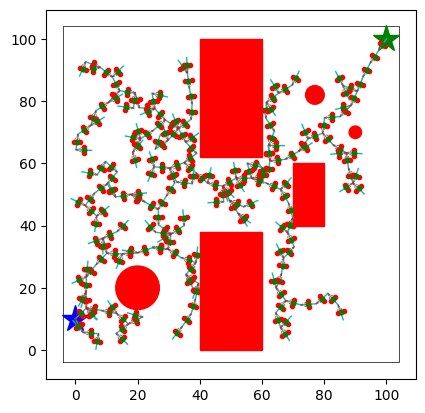

In [28]:
import os
import random
import math
import numpy as np
import matplotlib.pyplot as plt
import make_video

class env:
    def __init__(self, x_start, y_start, x_goal, y_goal, rbot, xmin=0, xmax=100, ymin=0, ymax=100):
        self.x_start, self.y_start, self.x_goal, self.y_goal = x_start, y_start, x_goal, y_goal
        self.xlim = (xmin, xmax)
        self.ylim = (ymin, ymax)
        self.rbot = rbot
        self.obstacles()

    def obstacles(self):
        v_origx = [40, 40, 60, 60, 70, 70, 80, 80, 40, 40, 60, 60]
        v_origy = [62, 100, 100, 62, 40, 60, 60, 40, 0, 38, 38, 0]
        vx = [i for i in v_origx]
        vy = [i for i in v_origy]
        radii = [7, 2, 3]
        circle_x = [20, 90, 77]
        circle_y = [20, 70, 82]
        num_circles = len(circle_x)

        self.num_rectangles = 3
        self.obst_x = vx
        self.obst_y = vy
        self.radii = radii
        self.circle_x = circle_x
        self.circle_y = circle_y
        self.num_circles = num_circles

    def draw(self, nodes=None, edges=None, node_index=None, final_path=None):
        plt.plot([0 - 2 * self.rbot, 0 - 2 * self.rbot, 100 + 2 * self.rbot, 100 + 2 * self.rbot, 0 - 2 * self.rbot],
                 [0 - 2 * self.rbot, 100 + 2 * self.rbot, 100 + 2 * self.rbot, 0 - 2 * self.rbot, 0 - 2 * self.rbot], 'k', lw=0.5)

        plt.plot(self.x_goal, self.y_goal, 'g*', markersize=20)
        plt.plot(self.x_start, self.y_start, 'b*', markersize=20)

        num = len(self.obst_x) / 4
        for i in range(1, int(num) + 1):
            x = self.obst_x[4 * (i - 1)]
            y = self.obst_y[4 * (i - 1)]
            width = self.obst_x[4 * (i - 1) + 2] - self.obst_x[4 * (i - 1)]
            height = self.obst_y[4 * (i - 1) + 2] - self.obst_y[4 * (i - 1)]
            rect = plt.Rectangle((x, y), width, height, linewidth=1, color='r')
            plt.gca().add_patch(rect)

        for i in range(self.num_circles):
            circle = plt.Circle((self.circle_x[i], self.circle_y[i]), self.radii[i], color='r')
            plt.gca().add_patch(circle)

        if nodes is not None and edges is not None and node_index is not None:
            self.draw_rrt_path(nodes, edges, node_index, final_path)

        plt.gca().set_aspect('equal', adjustable='box')

    def rrt_algorithm(self, max_iter=1000, step_size=5):
        nodes = [(self.x_start, self.y_start)]
        edges = []
        for _ in range(max_iter):
            random_point = (random.uniform(self.xlim[0], self.xlim[1]),
                            random.uniform(self.ylim[0], self.ylim[1]))

            nearest_node = min(nodes, key=lambda node: math.dist(node, random_point))

            theta = math.atan2(random_point[1] - nearest_node[1], random_point[0] - nearest_node[0])
            new_node = (nearest_node[0] + step_size * math.cos(theta),
                        nearest_node[1] + step_size * math.sin(theta))

            if not self.collision(nearest_node, new_node):
                nodes.append(new_node)
                edges.append((nearest_node, new_node))

                if math.dist(new_node, (self.x_goal, self.y_goal)) < step_size:
                    nodes.append((self.x_goal, self.y_goal))
                    edges.append((new_node, (self.x_goal, self.y_goal)))
                    break

        return nodes, edges

    def collision(self, point1, point2):
        for i in range(0, len(self.obst_x), 4):
            x_min = min(self.obst_x[i], self.obst_x[i + 2])
            x_max = max(self.obst_x[i], self.obst_x[i + 2])
            y_min = min(self.obst_y[i], self.obst_y[i + 2])
            y_max = max(self.obst_y[i], self.obst_y[i + 2])

            for t in np.arange(0, 1, 0.01):
                x_point = int((1 - t) * point1[0] + t * point2[0])
                y_point = int((1 - t) * point1[1] + t * point2[1])

                if x_min <= x_point <= x_max and y_min <= y_point <= y_max:
                    return True

        for i in range(self.num_circles):
            circle_center = (self.circle_x[i], self.circle_y[i])
            distance_to_line = abs(np.cross(np.array(point2) - np.array(point1), np.array(point1) - np.array(circle_center))) / np.linalg.norm(np.array(point2) - np.array(point1))
            if distance_to_line <= self.radii[i] and 0 <= self.closest_point_on_line(point1, point2, circle_center) <= 1:
                return True

        return False

    def closest_point_on_line(self, point1, point2, point):
        line_vector = np.array(point2) - np.array(point1)
        point_vector = np.array(point) - np.array(point1)
        projection_length = np.dot(point_vector, line_vector) / np.dot(line_vector, line_vector)

        return max(0, min(projection_length, 1))

    def draw_rrt_path(self, nodes, edges, node_index, final_path=None):
        self.draw()

        for i in range(min(node_index, len(edges))):
            edge = edges[i]
            plt.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], 'c-', linewidth=1)

        if final_path is not None:
            for i in range(len(final_path) - 1):
                plt.plot([final_path[i][0], final_path[i + 1][0]], [final_path[i][1], final_path[i + 1][1]], 'm-', linewidth=2)

    def draw_wheel_trajectories(self, nodes, edges, node_index):
        for i in range(min(node_index, len(edges))):
            edge = edges[i]
            x1, y1 = edge[0]
            x2, y2 = edge[1]

            theta = math.atan2(y2 - y1, x2 - x1)
            mid_x = (x1 + x2) / 2
            mid_y = (y1 + y2) / 2

            car_width = 2.0
            left_wheel_x = mid_x - 0.5 * car_width * math.sin(theta)
            left_wheel_y = mid_y + 0.5 * car_width * math.cos(theta)
            right_wheel_x = mid_x + 0.5 * car_width * math.sin(theta)
            right_wheel_y = mid_y - 0.5 * car_width * math.cos(theta)

            plt.plot([x1, left_wheel_x], [y1, left_wheel_y], 'r--', linewidth=0.5)
            plt.plot([left_wheel_x, mid_x], [left_wheel_y, mid_y], 'ro-', markersize=3)
            plt.plot([x1, right_wheel_x], [y1, right_wheel_y], 'r--', linewidth=0.5)
            plt.plot([right_wheel_x, mid_x], [right_wheel_y, mid_y], 'ro-', markersize=3)

            plt.plot(mid_x, mid_y, 'go', markersize=3)

    def generate_trajectory_video(self, nodes, edges, output_path, fps=10):
        os.makedirs(output_path, exist_ok=True)

        for i, node in enumerate(nodes):
            plt.clf()
            self.draw_rrt_path(nodes[:i + 1], edges, i)
            plt.savefig(os.path.join(output_path, f"trajectory_frame_{i:04d}.png"))

        make_video.frames_to_video(output_path, output_path + "/trajectory_video.mp4", fps)
        
    def generate_wheel_trajectories_video(self, nodes, edges, output_path, fps=10):
        os.makedirs(output_path, exist_ok=True)

        for i, node in enumerate(nodes):
            plt.clf()
            self.draw_rrt_path(nodes[:i + 1], edges, i)
            self.draw_wheel_trajectories(nodes, edges, i)
            plt.savefig(os.path.join(output_path, f"wheel_trajectory_frame_{i:04d}.png"))

        make_video.frames_to_video(output_path, output_path + "/wheel_trajectory_video.mp4", fps)

# Goal and start location region
x_start, y_start, x_goal, y_goal = 0, 10, 100, 100
# Radius of the robot
r_bot = 2
# Environment instance
E = env(x_start, y_start, x_goal, y_goal, r_bot, 0, 100, 0, 100)

# Run RRT algorithm
nodes, edges = E.rrt_algorithm(max_iter=500, step_size=5)
# Draw RRT path directly on the main environment
E.draw_rrt_path(nodes, edges, len(nodes)-1, final_path=nodes)
# Draw wheel trajectories directly on the main environment
E.draw_wheel_trajectories(nodes, edges, len(nodes)-1)
# Draw and save trajectory video
E.generate_trajectory_video(nodes, edges, "./trajectory_frames", fps=10)
# Draw and save wheel trajectories video
E.generate_wheel_trajectories_video(nodes, edges, "./wheel_trajectories_frames", fps=10)
